<a href="https://colab.research.google.com/github/izzyoungs/portfolio/blob/master/CaBi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#Start by connecting gdrive into the google colab
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import rc
rc('animation', html='jshtml')
import contextily as cx
from IPython import display

In [3]:
# Load the dataset
data = pd.read_csv('/content/gdrive/MyDrive/Colab Notebooks/data/cabi.csv')

# Drop the 'Unnamed: 0' column
data.drop('Unnamed: 0', axis=1, inplace=True)

# Drop rows with missing 'date_time' values
data.dropna(subset=['date_time'], inplace=True)

# Convert 'date_time' to datetime format
data['date_time'] = pd.to_datetime(data['date_time'])

In [4]:
# Calculate utilization
data['utilization'] = data['num_bikes_available'] / data['capacity']

# Extract hour from 'date_time'
data['hour'] = data['date_time'].dt.hour

# Multiply the utilization so that the markersize is larger
data['utilization_adjusted'] = data['utilization']*100

# Calculate average utilization per hour for each station
avg_utilization_hourly = data.groupby(['station_id', 'hour', 'lon', 'lat']).agg({'utilization_adjusted': 'mean'}).reset_index()

In [5]:
avg_utilization_hourly.head()

,station_id,hour,lon,lat,utilization_adjusted
0,0824741d-1f3f-11e7-bf6b-3863bb334450,0,-77.0429,38.9003,2.222222
1,0824741d-1f3f-11e7-bf6b-3863bb334450,1,-77.0429,38.9003,2.222222
2,0824741d-1f3f-11e7-bf6b-3863bb334450,2,-77.0429,38.9003,2.222222
3,0824741d-1f3f-11e7-bf6b-3863bb334450,3,-77.0429,38.9003,0.000000
4,0824741d-1f3f-11e7-bf6b-3863bb334450,4,-77.0429,38.9003,0.000000


In [6]:
# Create a GeoDataFrame from the data
gdf = gpd.GeoDataFrame(
    avg_utilization_hourly, geometry=gpd.points_from_xy(avg_utilization_hourly.lon, avg_utilization_hourly.lat))

# Set and update CRS to match basemap
gdf.crs = 4326
gdf_crs = gdf.to_crs(epsg=3857)

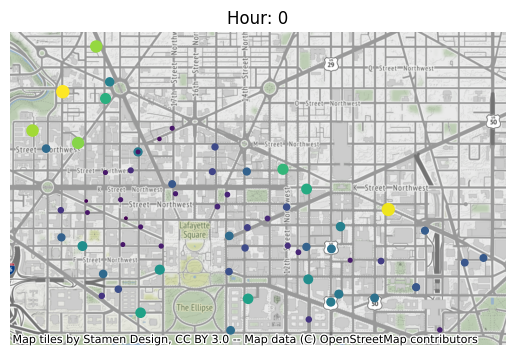

In [46]:
# Create a figure
fig, ax = plt.subplots()

def update(hour):
    ax.clear()
    gdf_crs[gdf_crs['hour'] == hour].plot(ax=ax, markersize='utilization_adjusted', column='utilization_adjusted', legend=False)
    plt.title(f'Hour: {hour}')
    cx.add_basemap(ax)
    ax.set_axis_off()

# Create an animation
ani = animation.FuncAnimation(fig, update, frames=24, repeat=True)

# Display animated map
display.HTML(ani.to_jshtml())